In [238]:
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
import matplotlib as mpl
from plotly import express as px
from plotly import graph_objects as go

from Bio.Phylo.TreeConstruction import DistanceTreeConstructor, DistanceMatrix, DistanceCalculator
from Bio import Phylo
from Bio import AlignIO

In [220]:
# Plots stuff
sns.set()
plt.rcParams['figure.figsize'] = [8, 8]
plt.rcParams['figure.dpi'] = 100 # 200 e.g. is really fine, but slower
pd.options.plotting.backend = "matplotlib"

# Build corr matrix

In [164]:
# agg_zscores = pd.read_csv('zscores_agg_50.csv', index_col=0, header=0)
# agg_zscores.head()

In [165]:
# mean_z_data ={}
# median_z_data ={}


# for seq_id, g_df in agg_zscores.groupby('Sequence_id'):
#     g_df = g_df.set_index(g_df['Start'])
#     mean_zscore = g_df['Mean_Z-Score']
#     median_zscore = g_df['Median_Z-Score']
#     mean_z_data[seq_id] = mean_zscore
#     median_z_data[seq_id] = median_zscore


# mean_z_df = pd.DataFrame(mean_z_data, columns=mean_z_data.keys()).fillna(0)
# median_z_df = pd.DataFrame(median_z_data, columns=median_z_data.keys()).fillna(0)
# mean_z_data ={}
# median_z_data ={}

In [166]:
# mean_corr_df = mean_z_df.corr()

# sns.heatmap(mean_corr_df, annot=True)
# plt.show()

In [167]:
# median_corr_df = median_z_df.corr()
# sns.heatmap(median_corr_df, annot=True)
# plt.show()

# Cladomgram

In [325]:
names_df = pd.read_csv('viruses_32.csv', header=0)
names_df= names_df.reset_index(drop=False)

names_df= names_df.set_index('accession')
names_df['index'] = (names_df['index'] + 1).astype(str)
names_df
# names_df.drop(index=['AY274119'], inplace=True)

,index,label,name
accession,,,
AY274119,1,1,SARS CoV Tor2
AY278488,2,2,SARS CoV BJ01
AY613950,3,3,SARS CoV PC4-227
AY304486,4,4,SARS CoV SZ3
KC881006,5,8,SARS related CoV Rs3367 CHN Rhinolophus sinicus
KJ473816,6,9,SARS related CoV YN2013 CHN Rhinolophus sinicus
FJ588686,7,10,SARS related CoV Rs672/2006 CHN Rhinolophus si...
KY417143,8,11,SARS related CoV Rs4081 CHN Rhinolophus sinicus
KY417142,9,12,SARS related CoV As6526 CHN Aselliscus stolicz...


In [265]:
# _lower_tri_matrix = (1 - median_corr_df).values.tolist()
# lower_tri_matrix = []
# for i, row in enumerate(_lower_tri_matrix):
#     lower_tri_matrix.append(row[:i+1])

# constructor = DistanceTreeConstructor()
# median_dm = DistanceMatrix(matrix=lower_tri_matrix,
#                            names=(
#                                median_corr_df.index.map(
#                                lambda item: item[:-2] + names_df.loc[item[:-2].replace('_', '')][1]
#                                )
#                            ).tolist())

# UGMATree = constructor.upgma(median_dm)
# for node in UGMATree.get_nonterminals():
#     node.name = None
# Phylo.draw(UGMATree)

In [266]:
# _lower_tri_matrix = (1 - mean_corr_df).values.tolist()
# lower_tri_matrix = []
# for i, row in enumerate(_lower_tri_matrix):
#     lower_tri_matrix.append(row[:i+1])

# constructor = DistanceTreeConstructor()
# mean_dm = DistanceMatrix(matrix=lower_tri_matrix,
#                            names=(
#                                mean_corr_df.index.map(
#                                lambda item: item[:-2] + names_df.loc[item[:-2].replace('_', '')][1]
#                                )
#                            ).tolist())
# UGMATree = constructor.upgma(mean_dm)
# for node in UGMATree.get_nonterminals():
#     node.name = None
# Phylo.draw(UGMATree)

# 10 bp agg

In [267]:
agg_zscores = pd.read_csv('aligned_zscores_agg_10.csv', index_col=0, header=0)
agg_zscores.head()

mean_z_data ={}
median_z_data ={}


for seq_id, g_df in agg_zscores.groupby('Sequence_id'):
    g_df = g_df.set_index(g_df['Start'])
    mean_zscore = g_df['Mean_Z-Score']
    median_zscore = g_df['Median_Z-Score']
    mean_z_data[seq_id] = mean_zscore
    median_z_data[seq_id] = median_zscore


mean_z_df = pd.DataFrame(mean_z_data, columns=mean_z_data.keys()).fillna(0)
median_z_df = pd.DataFrame(median_z_data, columns=median_z_data.keys()).fillna(0)
mean_z_data ={}
median_z_data ={}

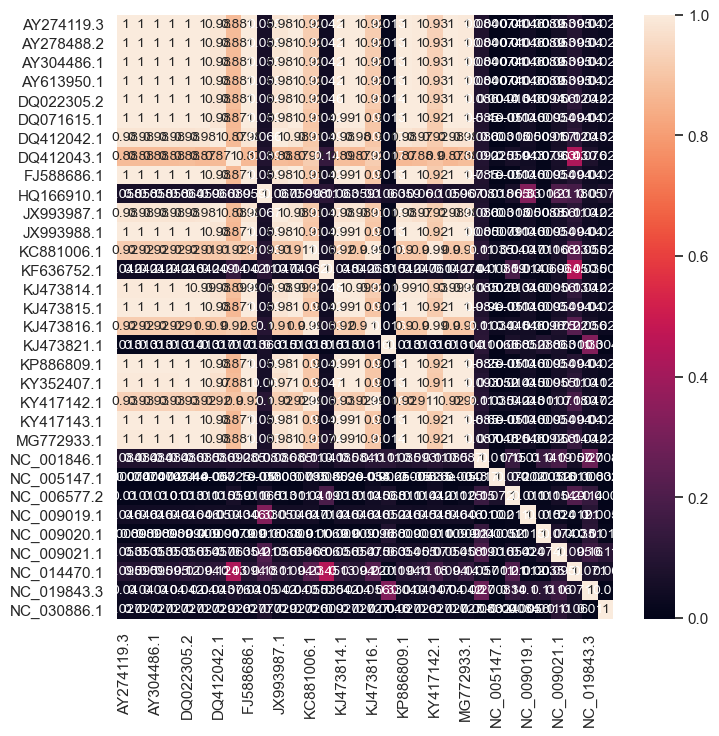

In [269]:
mean_corr_df = mean_z_df.corr()

sns.heatmap(mean_corr_df, annot=True)
plt.show()

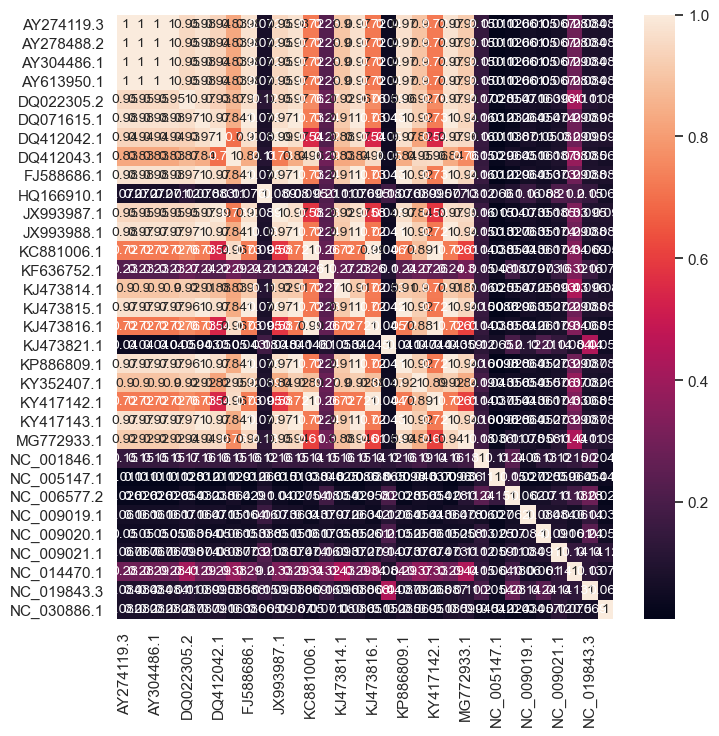

In [270]:
median_corr_df = median_z_df.corr()
sns.heatmap(median_corr_df, annot=True)
plt.show()

# Median

/var/folders/92/ml61nt355nb1nv82hmrrmz300000gn/T/ipykernel_9282/4141578198.py:21: UserWarning:

Attempting to set identical left == right == 1 results in singular transformations; automatically expanding.



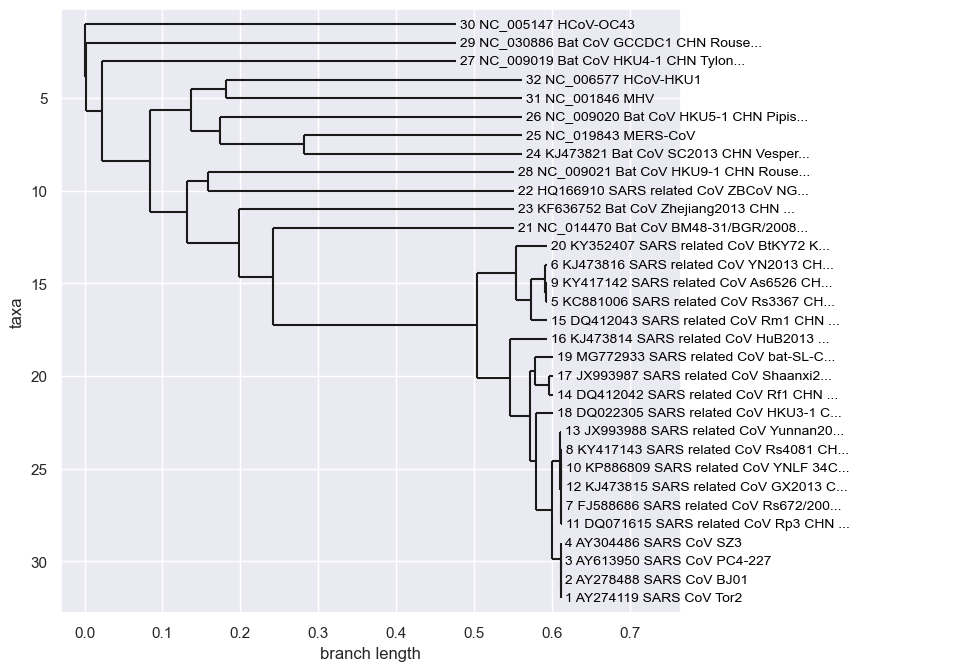

In [326]:
_lower_tri_matrix = (1 - median_corr_df).values.tolist()
lower_tri_matrix = []
for i, row in enumerate(_lower_tri_matrix):
    lower_tri_matrix.append(row[:i+1])

constructor = DistanceTreeConstructor()
median_dm = DistanceMatrix(matrix=lower_tri_matrix,
                           names=(
                               median_corr_df.index.map(
                               lambda item: (
                                   names_df.loc[item[:-2].replace('_', '')][0] + ' ' +
                                   item[:-2] + ' ' + names_df.loc[item[:-2].replace('_', '')][2]
                               )
                               )
                           ).tolist())

UGMATree = constructor.upgma(median_dm)

for node in UGMATree.get_nonterminals():
    node.name = None
# Phylo.draw(UGMATree)
plot_tree(UGMATree, 1.1)

# Mean

/var/folders/92/ml61nt355nb1nv82hmrrmz300000gn/T/ipykernel_9282/4141578198.py:21: UserWarning:

Attempting to set identical left == right == 1 results in singular transformations; automatically expanding.



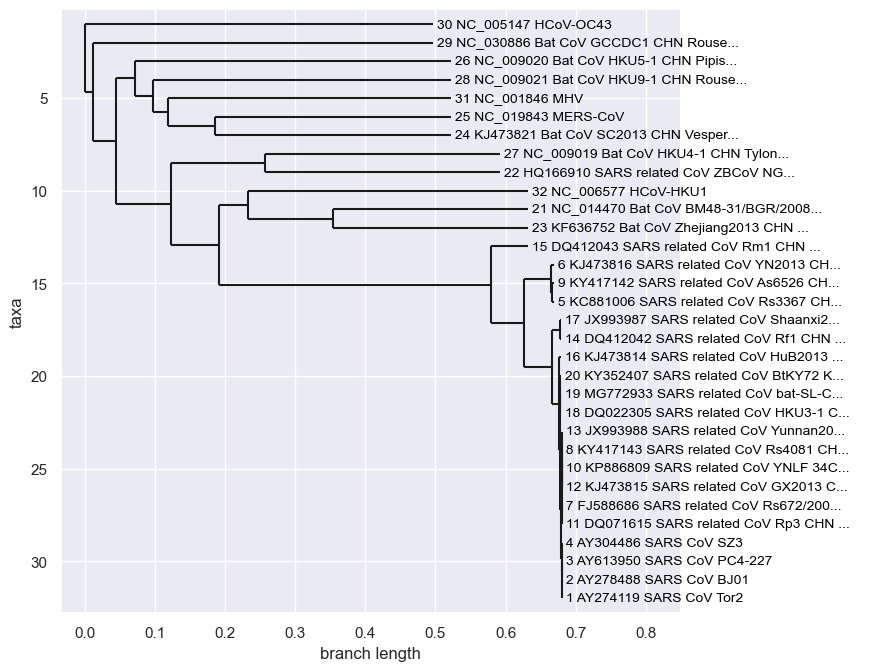

In [327]:
_lower_tri_matrix = (1 - mean_corr_df).values.tolist()
lower_tri_matrix = []
for i, row in enumerate(_lower_tri_matrix):
    lower_tri_matrix.append(row[:i+1])

constructor = DistanceTreeConstructor()
mean_dm = DistanceMatrix(matrix=lower_tri_matrix,
                           names=(
                               mean_corr_df.index.map(
                               lambda item: (
                                   names_df.loc[item[:-2].replace('_', '')][0] + ' ' +
                                   item[:-2] + ' ' + names_df.loc[item[:-2].replace('_', '')][2]
                               )
                               )
                           ).tolist())
UGMATree = constructor.upgma(mean_dm)
for node in UGMATree.get_nonterminals():
    node.name = None
plot_tree(UGMATree, 1.1)

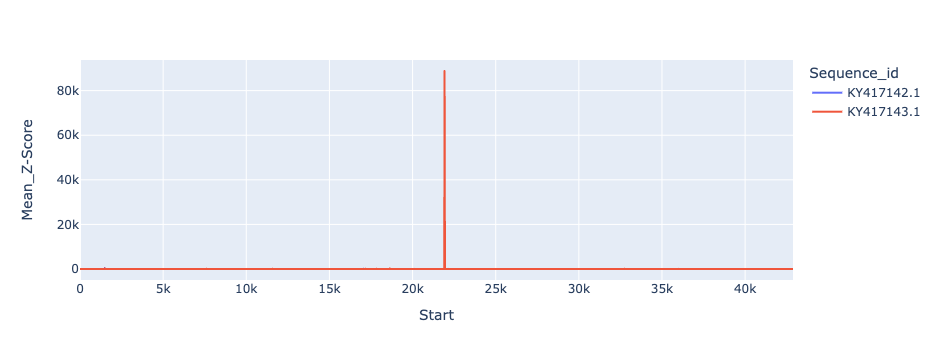

In [281]:
# fig, ax = plt.subplots(figsize=(8,6))

fig = px.line(
agg_zscores[
    agg_zscores['Sequence_id'].str.startswith('KY417')
],
x='Start', y='Mean_Z-Score', color='Sequence_id'
    
)
fig.show()

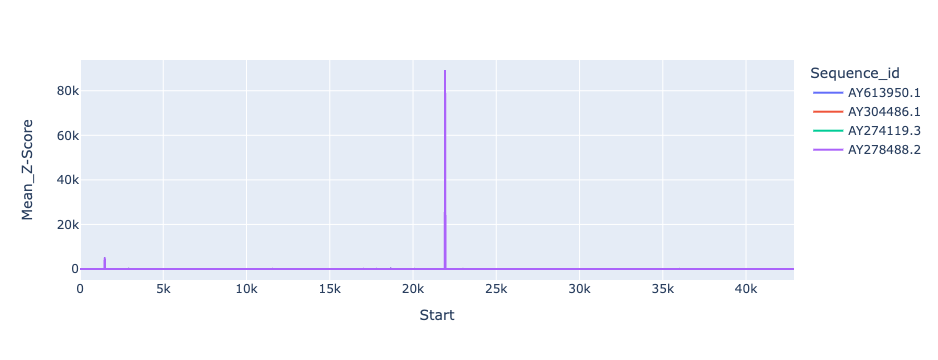

In [282]:
fig = px.line(
agg_zscores[
    agg_zscores['Sequence_id'].str.startswith('AY')
],
x='Start', y='Mean_Z-Score', color='Sequence_id'
    
)
fig.show()

In [283]:
agg_zscores['Sequence_id'].unique()

array(['MG772933.1', 'DQ412042.1', 'JX993988.1', 'KP886809.1',
       'KJ473815.1', 'DQ071615.1', 'AY613950.1', 'AY304486.1',
       'AY274119.3', 'AY278488.2', 'KC881006.1', 'KJ473816.1',
       'KY417142.1', 'FJ588686.1', 'KY417143.1', 'DQ022305.2',
       'JX993987.1', 'DQ412043.1', 'KJ473814.1', 'NC_014470.1',
       'KY352407.1', 'HQ166910.1', 'KF636752.1', 'NC_009019.1',
       'NC_009020.1', 'NC_019843.3', 'KJ473821.1', 'NC_030886.1',
       'NC_009021.1', 'NC_006577.2', 'NC_005147.1', 'NC_001846.1'],
      dtype=object)

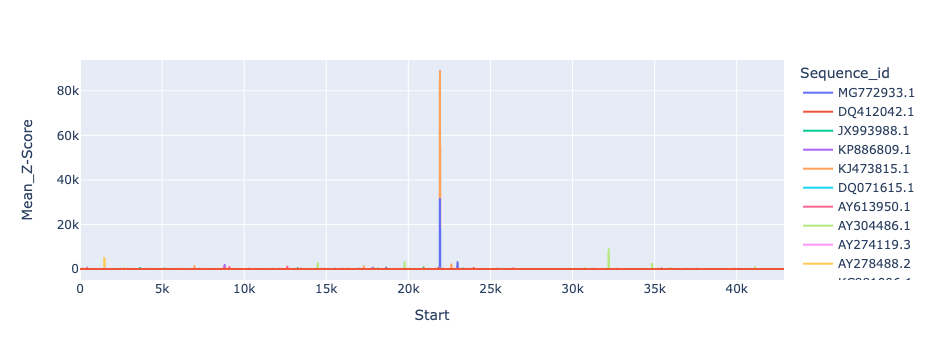

In [284]:
fig = px.line(
agg_zscores,
x='Start', y='Mean_Z-Score', color='Sequence_id'
    
)
fig.show()

In [285]:
unique_ids = pd.Series(agg_zscores['Sequence_id'].unique())

non_peak_ids = unique_ids[
    unique_ids.map(lambda _id: agg_zscores[agg_zscores['Sequence_id'] == _id
                                          ]['Mean_Z-Score'].max() < 5000)]
non_peak_ids

10     KC881006.1
11     KJ473816.1
12     KY417142.1
17     DQ412043.1
19    NC_014470.1
21     HQ166910.1
22     KF636752.1
23    NC_009019.1
24    NC_009020.1
25    NC_019843.3
26     KJ473821.1
28    NC_009021.1
29    NC_006577.2
30    NC_005147.1
31    NC_001846.1
dtype: object

In [286]:
peak_ids = unique_ids[
    unique_ids.map(lambda _id: agg_zscores[agg_zscores['Sequence_id'] == _id
                                          ]['Mean_Z-Score'].max() > 10000)]
peak_ids

1     DQ412042.1
2     JX993988.1
3     KP886809.1
4     KJ473815.1
5     DQ071615.1
6     AY613950.1
7     AY304486.1
8     AY274119.3
9     AY278488.2
13    FJ588686.1
14    KY417143.1
16    JX993987.1
20    KY352407.1
dtype: object

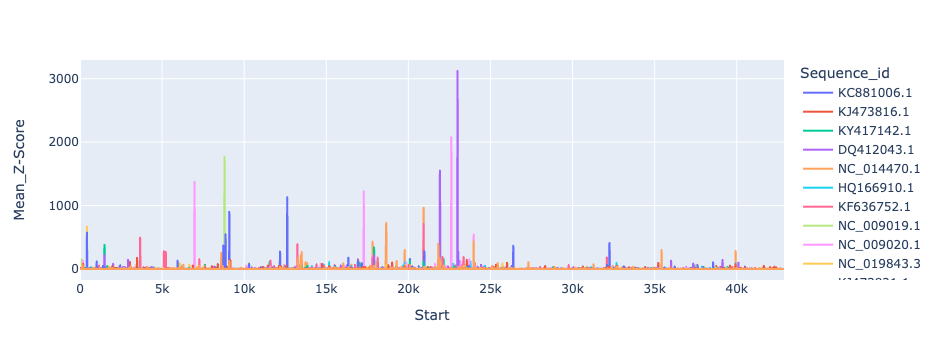

In [287]:

fig = px.line(
agg_zscores[
    agg_zscores['Sequence_id'].isin(non_peak_ids)
],
x='Start', y='Mean_Z-Score', color='Sequence_id'
    
)
fig.show()

In [288]:
median_corr_df.to_csv('correlation_aligned_32_coronaviruses.csv')

# Draw a regular tree

In [305]:
alignment = AlignIO.read('data/aligned_32_sequences.fasta', 'fasta')

/var/folders/92/ml61nt355nb1nv82hmrrmz300000gn/T/ipykernel_9282/259919217.py:21: UserWarning:

Attempting to set identical left == right == 1 results in singular transformations; automatically expanding.



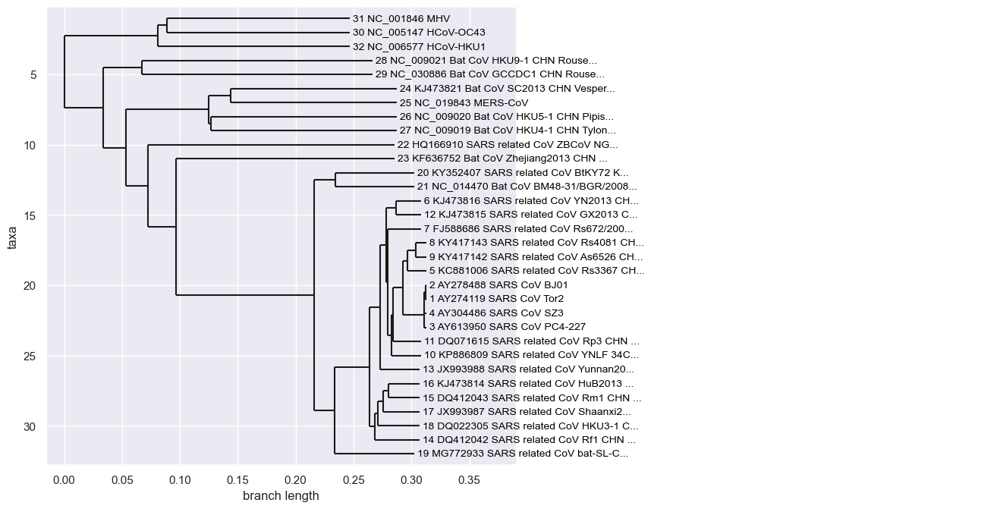

In [328]:
calculator = DistanceCalculator('identity')
dm = calculator.get_distance(alignment)
UGMATree = constructor.upgma(dm)
for node in UGMATree.get_nonterminals():
    node.name = None
for node in UGMATree.get_terminals():
    node.name = (
               names_df.loc[node.name[:-2].replace('_', '')][0] + ' ' +
               node.name[:-2] + ' ' + names_df.loc[node.name[:-2].replace('_', '')][2]
           )
# Phylo.draw(UGMATree)

def plot_tree(tree, coord):
    plt.ion()
    mpl.rc('font', size=10)
    # set the size of the figure
    fig = plt.figure(figsize=(8, 8), dpi=100)
    # alternatively
    # fig.set_size_inches(10, 20)
    axes = fig.add_subplot(1, 1, 1)
    axes.set_xlim(1)
    axes.text(coord, coord, " ")
    Phylo.draw(tree, axes=axes)

plot_tree(UGMATree, .8)


/var/folders/92/ml61nt355nb1nv82hmrrmz300000gn/T/ipykernel_9282/259919217.py:21: UserWarning:

Attempting to set identical left == right == 1 results in singular transformations; automatically expanding.



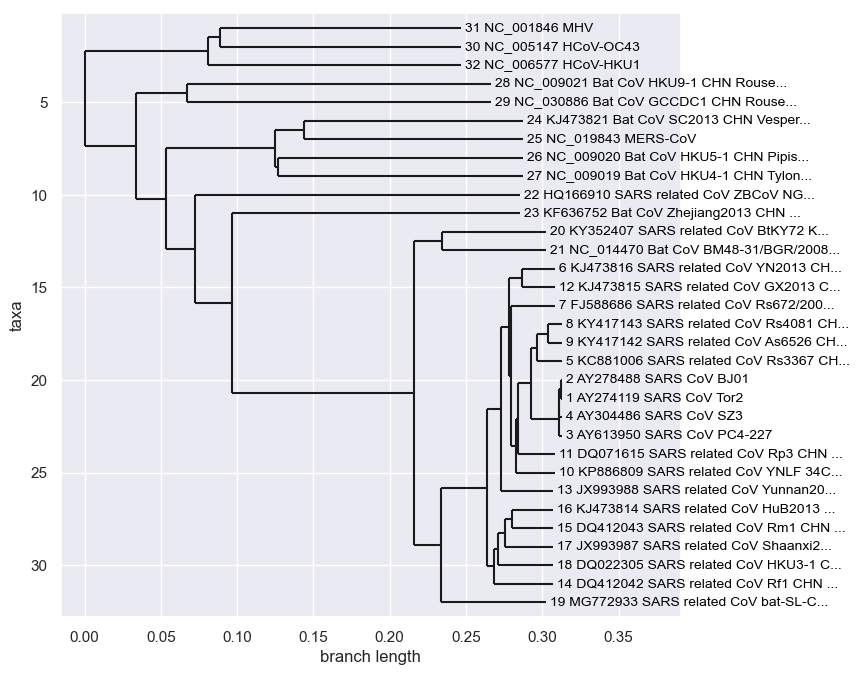

In [329]:
plot_tree(UGMATree, .5)

/var/folders/92/ml61nt355nb1nv82hmrrmz300000gn/T/ipykernel_9282/259919217.py:21: UserWarning:

Attempting to set identical left == right == 1 results in singular transformations; automatically expanding.



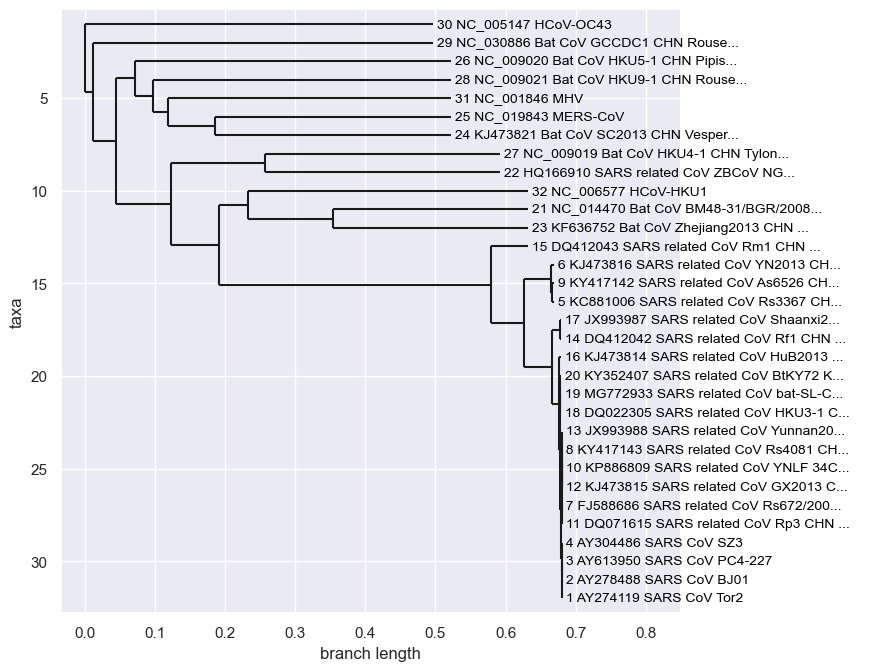

In [330]:
_lower_tri_matrix = (1 - mean_corr_df).values.tolist()
lower_tri_matrix = []
for i, row in enumerate(_lower_tri_matrix):
    lower_tri_matrix.append(row[:i+1])

constructor = DistanceTreeConstructor()
mean_dm = DistanceMatrix(matrix=lower_tri_matrix,
                           names=(
                               mean_corr_df.index.map(
                               lambda item: (
                                   names_df.loc[item[:-2].replace('_', '')][0] + ' ' +
                                   item[:-2] + ' ' + names_df.loc[item[:-2].replace('_', '')][2]
                               )
                               )
                           ).tolist())
UGMATree = constructor.upgma(mean_dm)
for node in UGMATree.get_nonterminals():
    node.name = None
plot_tree(UGMATree, 1.1)